#COVID-19: Co-author Network Analysis

Authors: Siddharth Agarwal, Evangelia (Elina) Oikonomou

Project for the course: Analysis of Large Scale Social Networks

MSc in Artificial Intelligence, KU Leuven

# Introduction
For this project we are going to study the co-author network of academic papers on COVID-19. We use the dataset published by Allen Institute of AI. It contains 5,168 scholarly articles about COVID-19, published from the beginning of 2020 until April 10th 2020.

For this project we are going to study 4 networks:
- Full network
- Reduced network excluding authors who have written only 1 paper and paper with only 1 author
- Largest component of reduced network
- Network with top 1% authors

We are going to investigate the centrality measures of the networks, different clustering algorithms, such as Infomap, Louvain and Leiden, and provide visualizations.

Link to the dataset: https://www.semanticscholar.org/cord19



In [28]:
# Install necessary packages
!pip install python-igraph
!pip install louvain
!pip install easygui
!pip install cairocffi
!pip install snap-stanford
!pip install GephiStreamer
!pip install pajek-tools
!pip install -U bokeh
!pip install networkx
!wget -q --show-progress https://github.com/gephi/gephi/releases/download/v0.9.2/gephi-0.9.2-linux.tar.gz
!tar xzf gephi-0.9.2-linux.tar.gz

Requirement already up-to-date: bokeh in /usr/local/lib/python3.6/dist-packages (2.0.2)
gephi-0.9.2-linux.t 100%[===================>]  77.10M  16.7MB/s    in 5.9s    


In [0]:
# Import the libraries
import numpy as np
from google.colab import files
from google.colab import drive
from IPython.display import display, Image
import random
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import igraph as ig
import easygui
import statistics
import os
import io
import re
import networkx as nx
import louvain

In [30]:
# Load the data from Github
url = 'https://raw.githubusercontent.com/elinaoik/sna-coauthor-collaboration-network-covid19/master/CSV%20as%20at%2009%20April%202020-Full%20database.csv'
df = pd.read_csv(url)
print(df.head())


                                               Title  ...                                               Tags
0  COVID-19 causes more delay in managed care lau...  ...  * Opinion piece; Ethics, social science, econo...
1  Daily Situation Report on Coronavirus disease ...  ...                                                NaN
2  Daily Situation Report on Coronavirus disease ...  ...                                                NaN
3  Daily Situation Report on Coronavirus disease ...  ...                                                NaN
4  Daily Situation Report on Coronavirus disease ...  ...                                                NaN

[5 rows x 16 columns]


In [31]:
# Titles of columns
print('Column titles:')
print(df.columns)
print('')
print('Matrix shape:', df.shape)
auth_col=df['Authors'].value_counts(dropna=False)
print('')
print('There are', auth_col[0], 'insertions where the Author information is missing.')

# Create dataset with 'Ref' and 'Authors'
df1 = df[['Ref', 'Authors']]

# Delete rows where authors do not exist
df2 = df1.dropna()
print(df2.head())
print(df2.shape)
df2['Authors'].value_counts(dropna=False)

Column titles:
Index(['Title', 'Authors', 'Abstract', 'Published Year', 'Published Month',
       'Journal', 'Volume', 'Issue', 'Pages', 'Accession Number', 'DOI', 'Ref',
       'Covidence #', 'Study', 'Notes', 'Tags'],
      dtype='object')

Matrix shape: (5362, 16)

There are 197 insertions where the Author information is missing.
      Ref                                            Authors
9   44994              Zuckier, Lionel S.; Gordon, Sharon R.
10  50486              Zoller, M.; Irlbeck, M.; Zwissler, B.
11  45165  Zhu, Hai-Dong; Zeng, Chu-Hui; Lu, Jian; Teng, ...
12  45106        Zhu, Feng; Cao, Yang; Xu, Shuyun; Zhou, Min
13  45104  Zhou, Zhi-Guo; Yue, Dong-Sheng; Mu, Chen-Lu; Z...
(5162, 2)


Mahase, Elisabeth                                                                                                                                                                                                                          36
Nature                                                                                                                                                                                                                                     26
Rimmer, Abi                                                                                                                                                                                                                                21
Iacobucci, Gareth                                                                                                                                                                                                                          20
Cohen, Jon                                      

In [32]:
# Create a database only with authors names 
data = df2[['Ref']].join(df2['Authors'].str.get_dummies('; '))
data = data.set_index('Ref')

# How many papers in total
print('The dataset consists of', data.shape[0], 'papers.')

# How many unique authors
print('The dataset consists of', data.shape[1], 'Authors.')


The dataset consists of 5162 papers.
The dataset consists of 20531 Authors.


##No of authors per paper

- Statistics for Authors per Paper -
Max Value:                   68
Min Value:                   1
Average Value:               5.21
Standard deviation:          5.85
------------------------------------------------------------------------
No of papers with 1 author:  1343,  which corresponds to 26.02% of total papers.
No of papers with 2 authors: 722,   which corresponds to 13.99% of total papers.
No of papers with 3 authors: 590,   which corresponds to 11.43% of total papers.
No of papers with 4 authors: 474,   which corresponds to 9.18% of total papers.
No of papers with 5 authors: 399,   which corresponds to 7.73% of total papers.
No of papers with >5 authors: 1634, which corresponds to 31.65% of total papers.


<function matplotlib.pyplot.show>

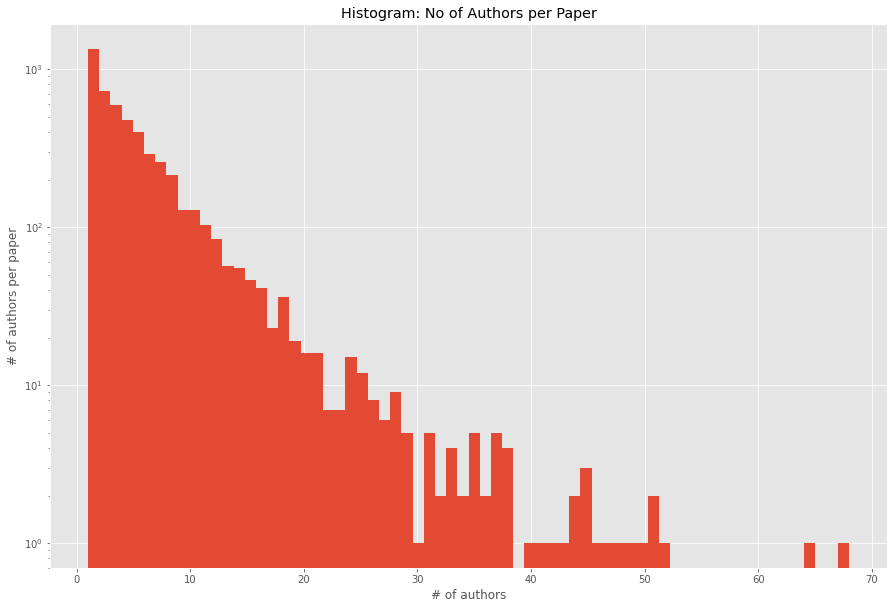

In [33]:
# Histogram: No of authors per paper
column_list = list(data)
sum_authors= data[column_list].sum(axis=1)
# print(list(data))

auth_dist = sum_authors

# Count how many authors with 1-2-3-4-5 papers
one_auth = 0
two_auth = 0
three_auth = 0
four_auth = 0
five_auth = 0
more_than_five_auth = 0

for i in range (len(auth_dist)):
  if auth_dist[i] == 1:
    one_auth += 1
  elif auth_dist[i] == 2:
    two_auth += 1
  elif auth_dist[i] == 3:
    three_auth += 1
  elif auth_dist[i] == 4:
    four_auth += 1
  elif auth_dist[i] == 5:
    five_auth += 1
  else:
    more_than_five_auth += 1


print('- Statistics for Authors per Paper -')
print('Max Value:                   {}'.format(auth_dist.max()))
print('Min Value:                   {}'.format(auth_dist.min()))
print('Average Value:               {}'.format(format(auth_dist.mean(),'.2f')))
print('Standard deviation:          {}'.format(format(auth_dist.std(),'.2f')))
print('------------------------------------------------------------------------')
print('No of papers with 1 author:  {},  which corresponds to {}% of total papers.'.format(one_auth, format(one_auth/data.shape[0]*100,'.2f')))
print('No of papers with 2 authors: {},   which corresponds to {}% of total papers.'.format(two_auth, format(two_auth/data.shape[0]*100,'.2f')))
print('No of papers with 3 authors: {},   which corresponds to {}% of total papers.'.format(three_auth, format(three_auth/data.shape[0]*100,'.2f')))
print('No of papers with 4 authors: {},   which corresponds to {}% of total papers.'.format(four_auth, format(four_auth/data.shape[0]*100,'.2f')))
print('No of papers with 5 authors: {},   which corresponds to {}% of total papers.'.format(five_auth, format(five_auth/data.shape[0]*100,'.2f')))
print('No of papers with >5 authors: {}, which corresponds to {}% of total papers.'.format(more_than_five_auth, format(more_than_five_auth/data.shape[0]*100,'.2f')))

plt.figure(figsize=(15,10))
plt.hist(auth_dist, bins=68, log=1)
plt.ylabel('# of authors per paper')
plt.xlabel('# of authors')
plt.title('Histogram: No of Authors per Paper')
plt.style.use('ggplot')
plt.show


##No of Papers per Author

@CDCgov             1
@NewsfromScience    1
A, K.               1
AI, Shanmu          1
AI, Yuhang          1
                   ..
謝晚媖                 1
譚志強                 1
鄭明德                 1
陳彩惠                 1
黃金龍                 1
Length: 20531, dtype: int64
- Statistics for Papers per Author -
Max Value:                   37
Min Value:                   1
Average Value:               1.31
Standard deviation:          1.06
------------------------------------------------------------------------
No of authors with 1 paper:  17068,   which corresponds to 83.13% of total authors.
No of authors with 2 papers: 2236,   which corresponds to 10.89% of total authors.
No of authors with 3 papers: 669,   which corresponds to 3.26% of total authors.
No of authors with 4 papers: 244,   which corresponds to 1.19% of total authors.
No of authors with 5 papers: 90,   which corresponds to 0.44% of total authors.
No of authors with >5 papers: 224,  which corresponds to 1.09% of total authors.

<function matplotlib.pyplot.show>

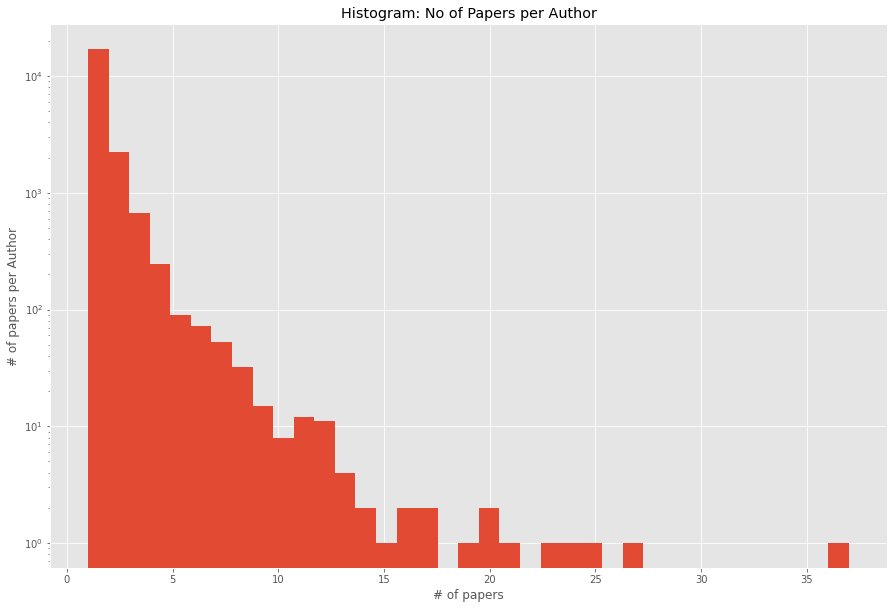

In [34]:
# Histogram: No of papers per author
papers_per_auth = data.loc[:,:'黃金龍'].sum(axis = 0, skipna = True) 
print(papers_per_auth)

# Count how many papers with 1-2-3-4-5 authors
one_paper = 0
two_paper = 0
three_paper = 0
four_paper = 0
five_paper = 0
more_than_five_paper = 0

for i in range (len(papers_per_auth)):
  if papers_per_auth[i] == 1:
    one_paper += 1
  elif papers_per_auth[i] == 2:
    two_paper += 1
  elif papers_per_auth[i] == 3:
    three_paper += 1
  elif papers_per_auth[i] == 4:
    four_paper += 1
  elif papers_per_auth[i] == 5:
    five_paper += 1
  else:
    more_than_five_paper += 1

print('- Statistics for Papers per Author -')
print('Max Value:                   {}'.format(papers_per_auth.max()))
print('Min Value:                   {}'.format(papers_per_auth.min()))
print('Average Value:               {}'.format(format(papers_per_auth.mean(),'.2f')))
print('Standard deviation:          {}'.format(format(papers_per_auth.std(),'.2f')))
print('------------------------------------------------------------------------')
print('No of authors with 1 paper:  {},   which corresponds to {}% of total authors.'.format(one_paper, format(one_paper/data.shape[1]*100,'.2f')))
print('No of authors with 2 papers: {},   which corresponds to {}% of total authors.'.format(two_paper, format(two_paper/data.shape[1]*100,'.2f')))
print('No of authors with 3 papers: {},   which corresponds to {}% of total authors.'.format(three_paper, format(three_paper/data.shape[1]*100,'.2f')))
print('No of authors with 4 papers: {},   which corresponds to {}% of total authors.'.format(four_paper, format(four_paper/data.shape[1]*100,'.2f')))
print('No of authors with 5 papers: {},   which corresponds to {}% of total authors.'.format(five_paper, format(five_paper/data.shape[1]*100,'.2f')))
print('No of authors with >5 papers: {},  which corresponds to {}% of total authors.'.format(more_than_five_paper, format(more_than_five_paper/data.shape[1]*100,'.2f')))


plt.figure(figsize=(15,10))
plt.hist(papers_per_auth, bins=papers_per_auth.max(), log=1)
plt.ylim = (0,papers_per_auth.max())
plt.ylabel('# of papers per Author')
plt.xlabel('# of papers')
plt.title('Histogram: No of Papers per Author')
plt.style.use('ggplot')
plt.show

##Investigate the outliers
- Papers with most co-authorships
- Authors with most publications

In [35]:
# Find the papers with most co-authorships

most_coauth_papers = []

for i in range (len(data.index)):
  if sum_authors[i] >= 40:
    paper_coauthors = []
    paper_coauthors.append(data.index[i])
    # We retreive the Title and Authors list from the initial df dataset

    paper_coauthors.append(sum_authors[i])
    most_coauth_papers.append(paper_coauthors)

most_coauth_papers = pd.DataFrame(most_coauth_papers, columns=('Ref', 'No of Co-authors'))
most_coauth_papers = most_coauth_papers.sort_values(by=['No of Co-authors'], ascending=False)

print('The papers with most Co-authors are:')
print(most_coauth_papers)

print('-----------------------------------------------------------')

# Find the most productive authors, who wrote more than 15 papers

most_productive_auth = []

for i in range (len(papers_per_auth)):
  if papers_per_auth[i] >= 15:
    auth_No_of_pap = []
    auth_No_of_pap.append(papers_per_auth.index[i])
    auth_No_of_pap.append(papers_per_auth[i])
    most_productive_auth.append(auth_No_of_pap)

most_productive_auth = pd.DataFrame(most_productive_auth, columns=('Authors', 'No of papers'))
most_productive_auth = most_productive_auth.sort_values(by=['No of papers'], ascending=False)

print('The most productive Authors are:')
print(most_productive_auth)

The papers with most Co-authors are:
      Ref  No of Co-authors
9    8952                68
11   9858                65
10   7932                52
13   4870                51
5   18687                51
15    700                50
18    472                49
0   37800                48
7   17692                47
6   18696                46
4   26294                45
16    921                45
17     78                45
12  11647                44
2   41597                44
14   1653                43
1   41533                42
3   31448                41
8   21135                40
-----------------------------------------------------------
The most productive Authors are:
              Authors  No of papers
4   Mahase, Elisabeth            37
5              Nature            27
13          Zhang, Y.            25
9            Wang, Y.            24
10  Wiwanitkit, Viroj            23
7         Rimmer, Abi            21
1   Iacobucci, Gareth            20
8            Wang, J. 

##Get the datasets for the two subnetworks
First, we define the full network excluding the authors who have written only 1 paper and the papers with only 1 author. From the histogram with No of papers per author, we see that 83.13% of the authors have written only 1 paper.

In [36]:
# Create a copy of the original dataset
data1 = data.copy()

# Remove author columns with sum smaller than 2, so authors who have written only 1 paper
data1.drop([col for col, val in data1.sum().iteritems() if val < 2], axis=1, inplace=True)

# Now we remove the paper rows which are empty
column_list1 = list(data1)
data1['sum_authors'] = data1[column_list1].sum(axis=1)

# Remove the papers with 0 and 1 authors
data1.drop(data1[data1['sum_authors'] < 2].index, inplace = True)
data1 = data1.drop(['sum_authors'], axis=1)

# How many papers in total
print('The dataset consists of', data1.shape[0], 'papers.')

# How many unique authors
print('The dataset consists of', data1.shape[1], 'Authors.')

print(data1.head)

The dataset consists of 1623 papers.
The dataset consists of 3463 Authors.
<bound method NDFrame.head of        Abassi, Zaid A.  Abbasi, Kamran  ...  Прилуцкий, А С  林展甲
Ref                                     ...                     
44994                0               0  ...               0    0
45106                0               0  ...               0    0
8661                 0               0  ...               0    0
15180                0               0  ...               0    0
45199                0               0  ...               0    0
...                ...             ...  ...             ...  ...
656                  0               0  ...               0    0
672                  0               0  ...               0    0
679                  0               0  ...               0    0
645                  0               0  ...               0    0
248                  0               0  ...               0    0

[1623 rows x 3463 columns]>


Next, we define the network of the top 1% of authors, meaning the authors with the most published papers. From the histogram of No of papers per author, we see that the top 1% of authors has published more than 5 papers. We also exclude papers that are written only by one author.

In [37]:
# Create a copy of the original dataset
data2 = data.copy()

# Remove author columns with sum smaller than 6, so authors who have written five or less papers
data2.drop([col for col, val in data2.sum().iteritems() if val < 6], axis=1, inplace=True)

# Now we remove the paper rows which are empty
column_list2 = list(data2)
data2['sum_authors'] = data2[column_list2].sum(axis=1)

# Remove the papers with 0 and 1 authors
data2.drop(data2[data2['sum_authors'] < 2].index, inplace = True)
data2 = data2.drop(['sum_authors'], axis=1)

# How many papers in total
print('The dataset consists of', data2.shape[0], 'papers.')

# How many unique authors
print('The dataset consists of', data2.shape[1], 'Authors.')

print(data2.head)

The dataset consists of 320 papers.
The dataset consists of 224 Authors.
<bound method NDFrame.head of        Ahmad, Tauseef  Akhmetzhanov, Andrei R.  ...  Zhuang, Zian  Zumla, Alimuddin
Ref                                             ...                                
45199               0                        0  ...             0                 0
44862               0                        0  ...             0                 0
45212               0                        0  ...             0                 0
19083               0                        0  ...             0                 0
45149               0                        0  ...             0                 0
...               ...                      ...  ...           ...               ...
761                 0                        0  ...             0                 0
474                 0                        0  ...             0                 0
793                 0                        0  ...      

##Define Functions
Here we define the clustering function and clustering plot function that will be used for our analysis.

###Centrality Measures

In [0]:
def centrality_measures(graph):

  # Calculate degree measures
  degree = graph.degree()
  avg_deg = np.average(degree)
  print("Number of degrees calculated: % 2d, minimum : % 2d, maximim : % 2d" %(len(degree), min(degree), max(degree)))
  print("Average degree: % 2d" %(avg_deg))

  # Find author with highest degree
  max_deg = graph.vs.select(_degree = graph.maxdegree())["label"]
  print('The author(s) with the highest degree is/are:', max_deg)

  # Calculate betweenness
  betweenness = graph.betweenness(weights=None)
  print("Betweeness: minimum: % 5.2f, maximum: % 5.2f" %(min(betweenness),max(betweenness)))

  # Find author with highest betweenness
  max_betw = graph.vs.select(_betweenness_gt = max(betweenness)-10)["label"]
  print('The author(s) with the highest betweenness is/are:', max_betw)
  
  # Calculate averaget path length
  apl = graph.average_path_length()
  print("Average Path Length: % .2f" %(apl))

  print('')

  # Summary
  summary = [graph.vcount(), graph.ecount(), min(degree), max(degree), avg_deg, 
             min(betweenness), max(betweenness), apl]

  # Scatter plot of degree & betweenness
  plt.scatter(degree, betweenness)
  plt.title('Scatter plot of degree & betweenness')
  plt.xlabel('Degree')
  plt.ylabel('Betweenness')

  np.corrcoef(degree, betweenness)
  plt.show()
  print('')

  # Plot: Degree Distribution
  deg_dist = graph.degree_distribution()
  ig.plot(deg_dist)
  #print(max(degree))
  hist,bins=np.histogram(degree,bins=np.linspace(0,140,29))
  #print(hist)
  #print(bins) 
  plt.plot(bins[1:],hist)
  plt.title('Degree Distribution')
  plt.xlabel('Degree')
  plt.ylabel('No of Nodes')
  plt.show()

  return summary

###Network Plotting Function

In [0]:
# Define the graph_plot function for visualizion of networks
def network_plot(graph, layout, size, filename, show_labels=False):

  """
  Kamada-Kawai layout: 'kk'
  Fruchterman-Reingold layout: 'fr'
  DRL layout: 'drl'
  """

  # Calculate degree
  degree = graph.degree()

  #Define style from network plotting
  visual_style = {}
  visual_style["vertex_size"] = [5 + v * 0.5 for v in degree]
  visual_style["vertex_color"] = "blue"
  visual_style["edge_width"] = 1
  visual_style["layout"] = graph.layout(layout)
  visual_style["bbox"] = (size, size)
  visual_style["margin"] = 10

  if show_labels == True:
    visual_style["vertex_label"] = graph.vs["label"]
    visual_style["vertex_label_size"]=5
  else:
    visual_style["vertex_label"] = None

  # Save graph
  out=ig.plot(graph, **visual_style)
  out.save(filename)

  # Read and show Graph
  plt.figure(figsize=(12,12))
  img=mpimg.imread(filename)
  plt.axis('off')
  plt.imshow(img)

###Clustering Function

In [0]:
#The clustering function we will use for every case
def clustering_func(graph, algo):

  if algo == "multilevel":
    cl = graph.community_multilevel()
  elif algo == "leiden_mod":
    cl = graph.community_leiden(objective_function="modularity")
  elif algo == "leiden_cpm":
    cl = graph.community_leiden(objective_function="CPM")
  elif algo == "infomap":
    cl = graph.community_infomap(trials=20)

  membership = cl.membership
  np_membership = np.array(membership)

  # Get a tuple of unique clusters & their frequency in numpy array
  uniqueClusters, occurCount = np.unique(np_membership, return_counts=True)
  print('In the network there are ', len(uniqueClusters), ' clusters.')

  # Zip both the arrays
  #listOfUniqueClusters = zip(uniqueClusters, occurCount)
  # print('Unique Clusters along with occurrence Count')
  # Iterate over the zip object
  #for elem in listOfUniqueClusters:
  #  print('Cluster No: ', elem[0] , ' Contains : ' , elem[1], ' nodes')

  modularity = graph.modularity(membership)
  print("The modularity for the",algo, "algorithm is {}".format(format(modularity, '.2f')))

  # Summary
  summary = [len(uniqueClusters), modularity]

  return cl, summary

###Cluster Plotting Function

In [0]:
#The cluster plotting function
def cluster_plot(graph, cluster, algo, size, filename, show_labels=False):
  
  """
  Kamada-Kawai layout: 'kk'
  Fruchterman-Reingold layout: 'fr'
  DRL layout: 'drl'
  """

  # Calculate betweenness
  betweenness = graph.betweenness(weights=None)

  # Define style from network plotting
  visual_style = {}
  visual_style["mark_groups"] = True
  visual_style["vertex_size"] = [7 + v * 0.0001 for v in betweenness]
  visual_style["edge_width"] = 1
  visual_style["layout"] = algo
  visual_style["bbox"] = (size,size)
  visual_style["margin"] = 20

  if show_labels == True:
    visual_style["vertex_label"] = graph.vs["label"]
    visual_style["vertex_label_size"]=8
  else:
    visual_style["vertex_label"] = None

  # Save Graph
  out = ig.plot(cluster, **visual_style)
  out.save(filename)

  # Read and show Graph
  plt.figure(figsize=(12,12))
  img=mpimg.imread(filename)
  plt.axis('off')
  plt.imshow(img)

# Part I: Full Network

To start with, we are considering the complete network as derived from the original dataset. 



In [0]:
# Initialize Graph
g = ig.Graph()

# Creat nodes of the network
g.add_vertices(data.columns)
am = data.T.dot(data)

In [0]:
am.to_csv("am.csv",index=False)

In [0]:
am_net = am.values
am_net2 = np.array(am_net - np.diag(am_net.diagonal()))

g = ig.Graph.Adjacency((am_net2 > 0).tolist())
g.es['weight'] = am_net2[am_net2.nonzero()]
g.vs['label'] = column_list

g.to_undirected()

In [0]:
# Save network into a .pkl file
g.write_pickle("author_graph.pkl")

# Download .pkl file
files.download("author_graph.pkl") 

KeyboardInterrupt: ignored

In [43]:
# Upload network from Pickle file
g = ig.Graph.Read_Pickle("author_graph.pkl")
g.to_undirected()

# Get the attributes and the number of nodes
print(g.vs.attribute_names())
print('Number of nodes: ', g.vcount())

# Get the attributes and the number of edges
print(g.es.attribute_names())
print('Number of edges: ', g.ecount())

['label']
Number of nodes:  20531
[]
Number of edges:  132394


##Centrality Measures

Number of degrees calculated:  20531, minimum :  0, maximim :  277
Average degree:  12
The author(s) with the highest degree is/are: ['Wang, Y.']
Betweeness: minimum:  0.00, maximum:  2400155.05
The author(s) with the highest betweenness is/are: ['Zhang, Wei']
Average Path Length:  5.16



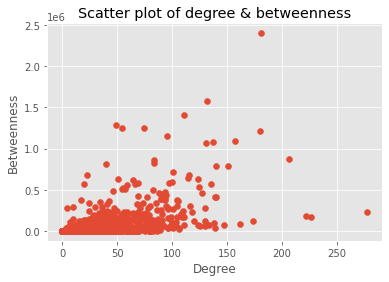

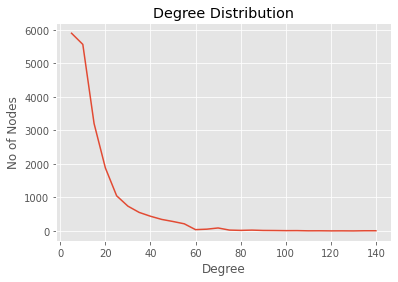

In [44]:
g_summary = centrality_measures(g)

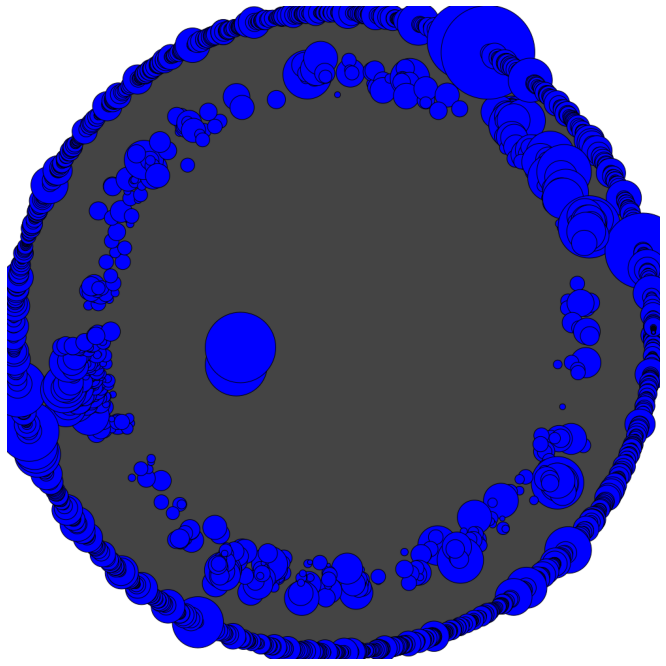

In [45]:
# Calculate Kamada-Kawai layout
network_plot(g, 'kk', 1000, 'g_network_kk.png')

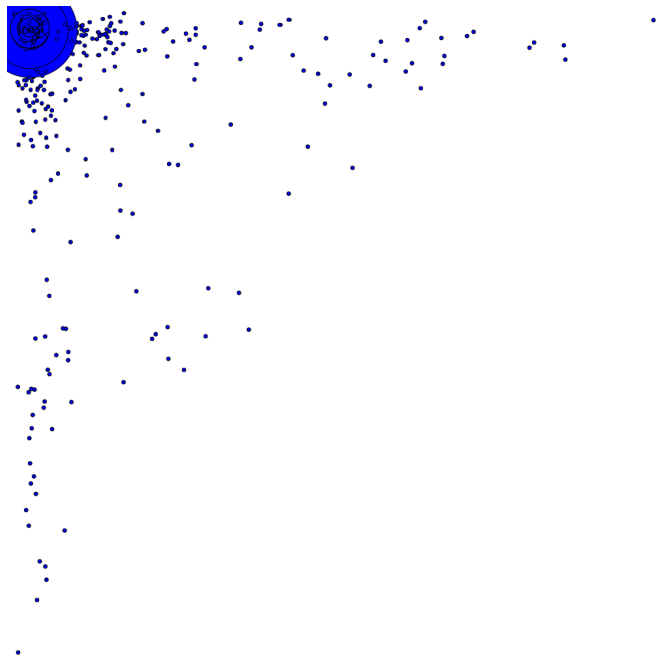

In [68]:
# Calculate FR layout
network_plot(g, 'fr', 1000, 'g_network_fr.png')

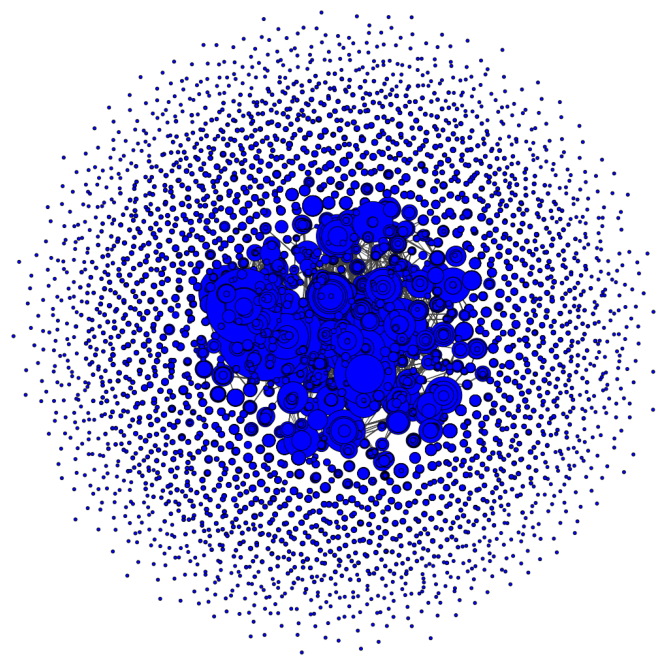

In [67]:
# Calculate DRL layout
network_plot(g, 'drl', 1000, 'g_network_fr.png')

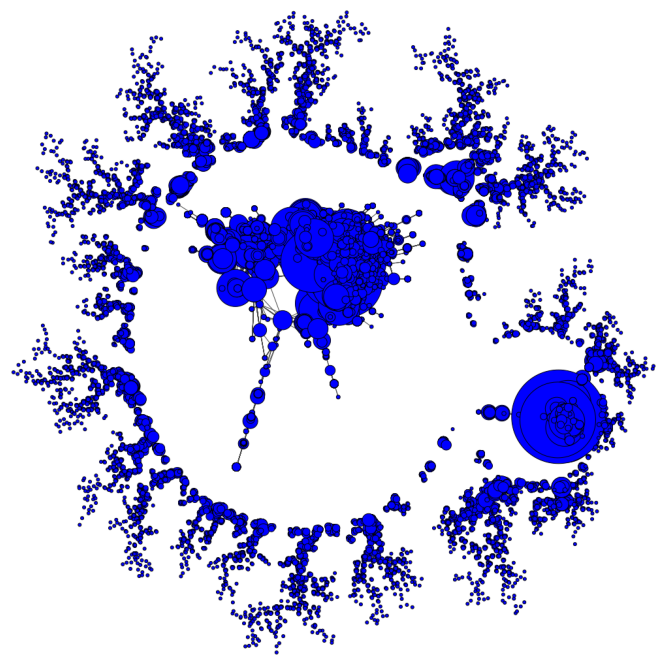

In [66]:
# Calculate Multidimentional Scaling layout
network_plot(g, 'MDS', 1000, 'g_network_mds.png')

## Community Analysis

###Leiden Algorithm

In [46]:
#The Leiden Method
g_leiden, g_leiden_sum = clustering_func(g, "leiden_mod")

In the network there are  2691  clusters.
The modularity for the leiden_mod algorithm is 0.95


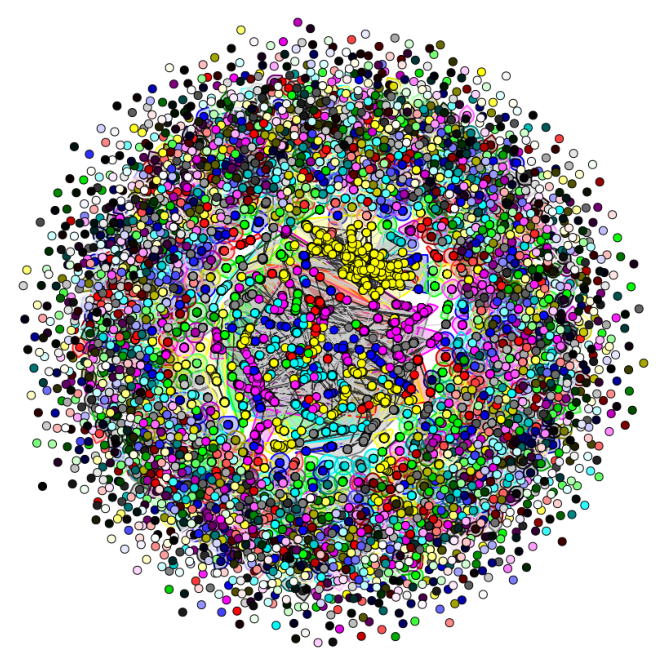

In [0]:
#The DRL plot
cluster_plot(g, g_leiden, "drl", 800, "g_leiden_drl.png")

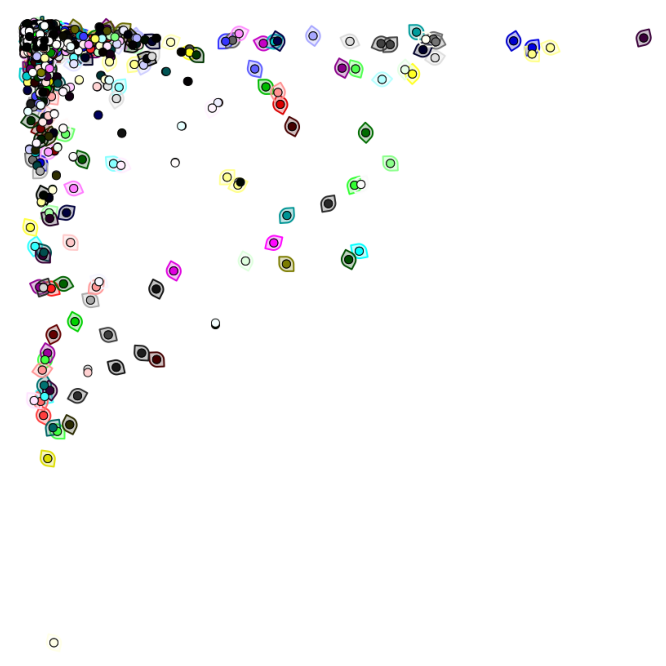

In [0]:
#The FR plot
cluster_plot(g, g_leiden, "fr", 800, "g_leiden_fr.png")

###Louvain Algorithm

In [0]:
#The Louvain Method
g_louvain, g_louvain_sum = clustering_func(g, "multilevel")

In the network there are  2686  clusters.
The modularity for the multilevel algorithm is 0.95


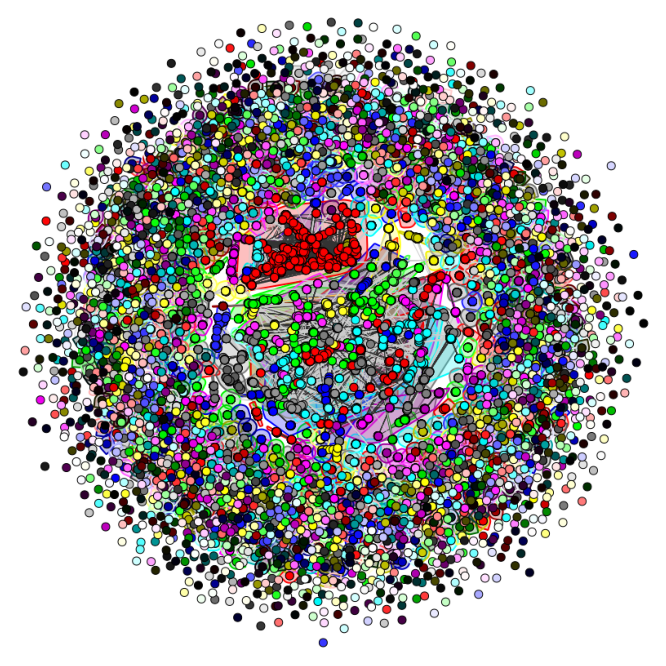

In [0]:
#The DRL plot
cluster_plot(g, g_louvain, "drl", 800, "g_louvain_drl.png")

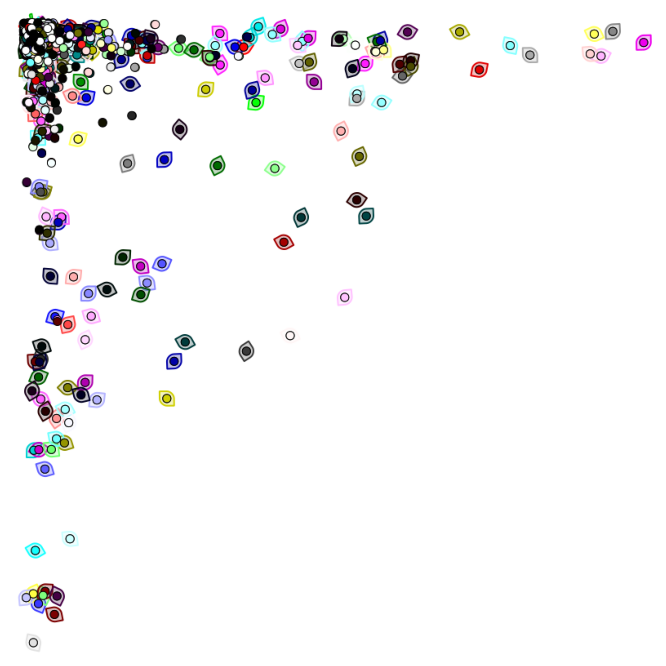

In [0]:
#The FR plot
cluster_plot(g, g_louvain, "fr", 800, "g_louvain_fr.png")

###Infomap Algorithm

In [0]:
#The Infomap Method
g_infomap, g_infomap_sum = clustering_func(g, "infomap")

In the network there are  3194  clusters.
The modularity for the infomap algorithm is 0.89


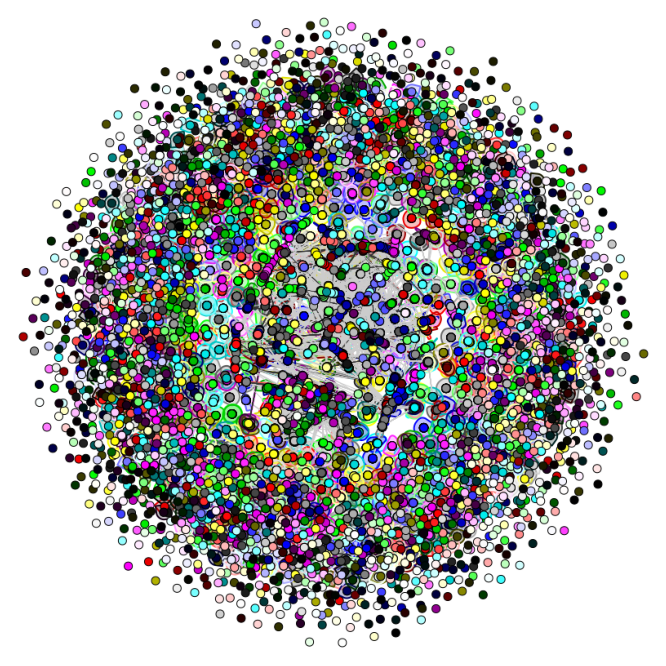

In [0]:
#The DRL plot
cluster_plot(g, g_infomap, "drl", 800, "g_infomap_drl.png")

# Part II: Reduced Network

At this part, we define a network without authors with 1 publication and papers with 1 author. Moreover, we remove the authors with degree = 1.

In [0]:
# Initialize Graph
g1 = ig.Graph()

# Creat nodes of the network
g1.add_vertices(data1.columns)
# Create unweighted adjacency matrix
am1 = data1.T.dot(data1)
# Save adjacency matric to .csv file
am1.to_csv("am1.csv",index=False)

In [0]:
am_net1 = am1.values
am_net1_2 = np.array(am_net1 - np.diag(am_net1.diagonal()))

g1 = ig.Graph.Adjacency((am_net1_2 > 0).tolist())
g1.es['weight'] = am_net1_2[am_net1_2.nonzero()]
g1.vs['label'] = column_list1

# Set the network to undirected
g1.to_undirected()

print("Number of nodes in graph: % 2d"  %(len(g1.vs()))) 

Number of nodes in graph:  3463


In [0]:
# Convert list of node degree to an np.array
# This allows the use of functions from numpy
degree = g1.degree()
np_deg = np.array(degree)

np_deg = np.where(np_deg>1)
print("Number of nodes with degree equal to or greater than the average: % 2d" %(len(np_deg[0])))

# Create subgraph using IDs of nodes to be retained
g1 = g1.subgraph(np_deg[0])
print("Number of nodes in subgraph: % 2d"  %(len(g1.vs()))) 

Number of nodes with degree equal to or greater than the average:  2980
Number of nodes in subgraph:  2980


In [0]:
# Save network to .pkl file
g1.write_pickle("author_graph_1.pkl")

# Download .pkl file
files.download( "author_graph_1.pkl" ) 

In [47]:
# Upload network from Pickle file
g1 = ig.Graph.Read_Pickle("author_graph_1.pkl")
g1.to_undirected()

# Get the attributes and the number of nodes
print(g1.vs.attribute_names())
print('Number of nodes: ', g1.vcount())

# Get the attributes and the number of edges
print(g1.es.attribute_names())
print('Number of edges: ', g1.ecount())

['label']
Number of nodes:  2980
[]
Number of edges:  19261


##Centrality Measures

Number of degrees calculated:  2980, minimum :  0, maximim :  133
Average degree:  12
The author(s) with the highest degree is/are: ['Wang, J.', 'Wang, Y.']
Betweeness: minimum:  0.00, maximum:  147847.86
The author(s) with the highest betweenness is/are: ['Zhang, Wei']
Average Path Length:  4.55



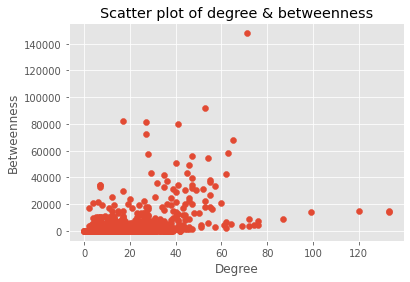

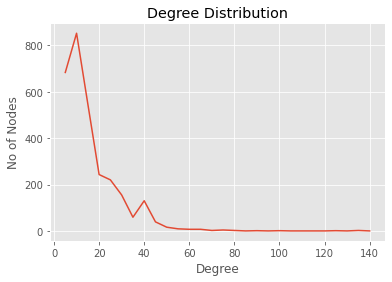

In [48]:
g1_summary = centrality_measures(g1)

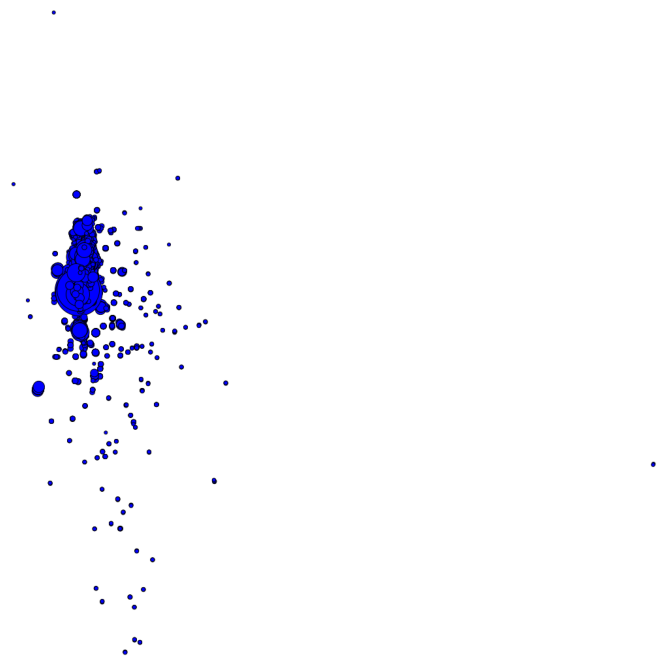

In [51]:
# Calculate FR layout
network_plot(g1, 'fr', 1000, 'g1_network_fr.png')

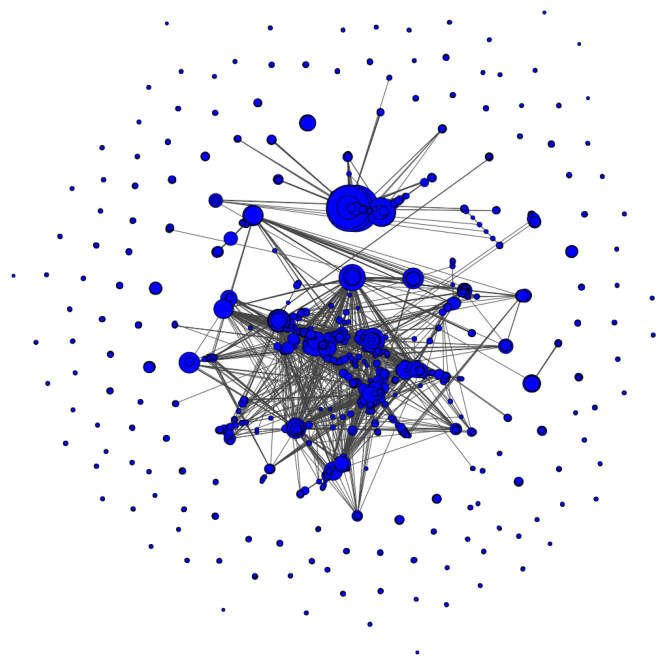

In [50]:
# Calculate DRL layout
network_plot(g1, 'drl', 1000, 'g1_network_drl.png')

##Community Analysis
1. InfoMAP
2. Louvain Algorithm
3. Leiden Algorithm


### Infomap Algorithm

In [52]:
# Community analysis with Infomap Algorithm
g1_infomap, g1_infomap_sum = clustering_func(g1, "infomap")

In the network there are  296  clusters.
The modularity for the infomap algorithm is 0.84


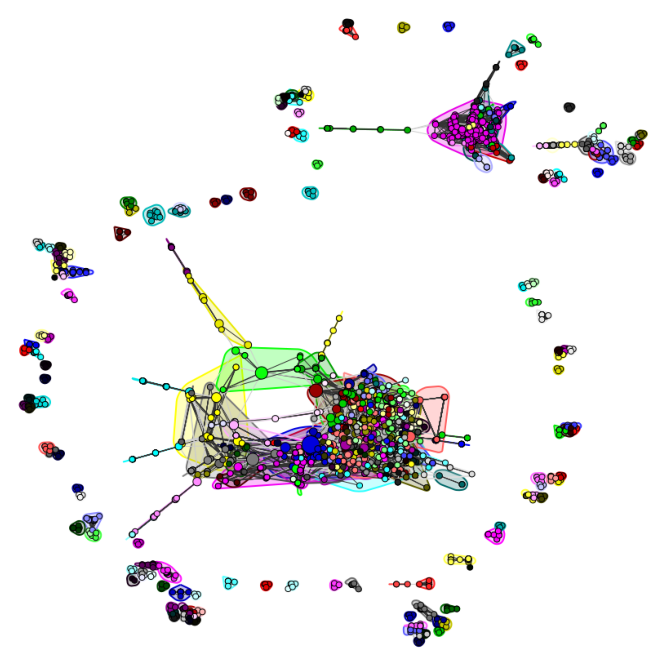

In [69]:
# Plot Network Communities with MDS layout
cluster_plot(g1, g1_infomap, "mds", 800, "g1_infomap_mds.png")

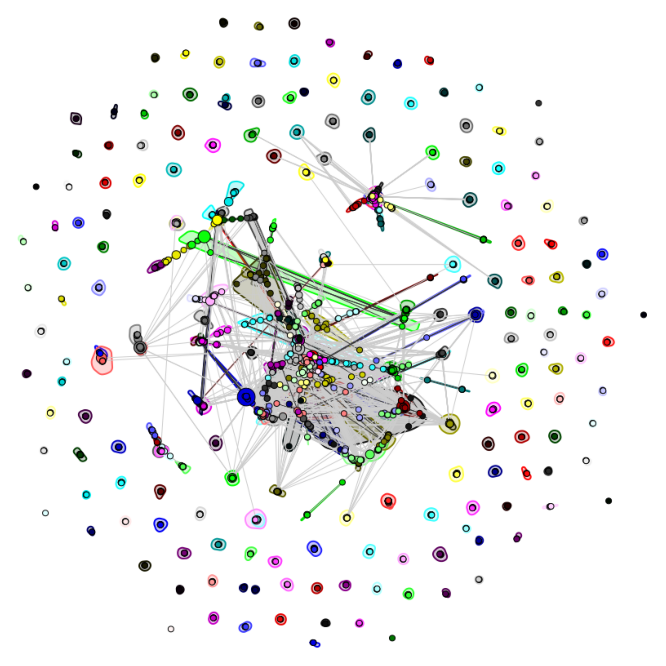

In [70]:
# Plot Network Communities with DRL layout
cluster_plot(g1, g1_infomap, "drl", 800, "g1_infomap_drl.png")

###Louvain Method

In [71]:
## Community Detection with Louvain Method
g1_louvain, g1_louvain_sum = clustering_func(g1, "multilevel")

In the network there are  178  clusters.
The modularity for the multilevel algorithm is 0.88


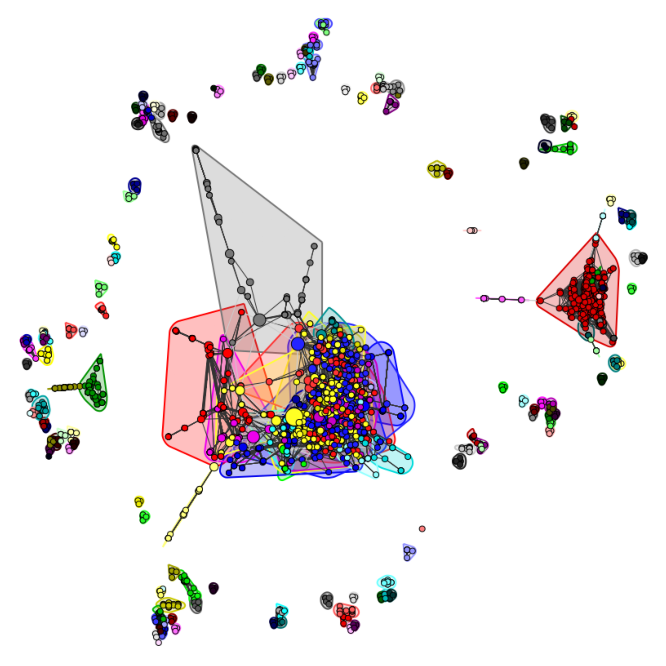

In [72]:
# Plot Network Communities with MDS layout
cluster_plot(g1, g1_louvain, "mds", 800, "g1_louvain_mds.png")

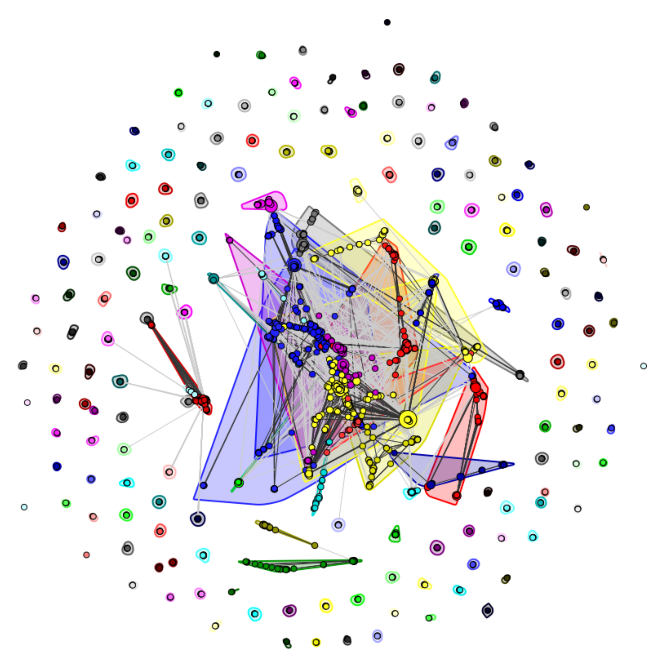

In [73]:
# Plot Network Communities with DRL layout
cluster_plot(g1, g1_louvain, "drl", 800, "g1_louvain_drl.png")

###Leiden Algorithm

In [74]:
## Community Detection with Leiden Algorithm
g1_leiden, g1_leiden_sum = clustering_func(g1, "leiden_mod")

In the network there are  179  clusters.
The modularity for the leiden_mod algorithm is 0.88


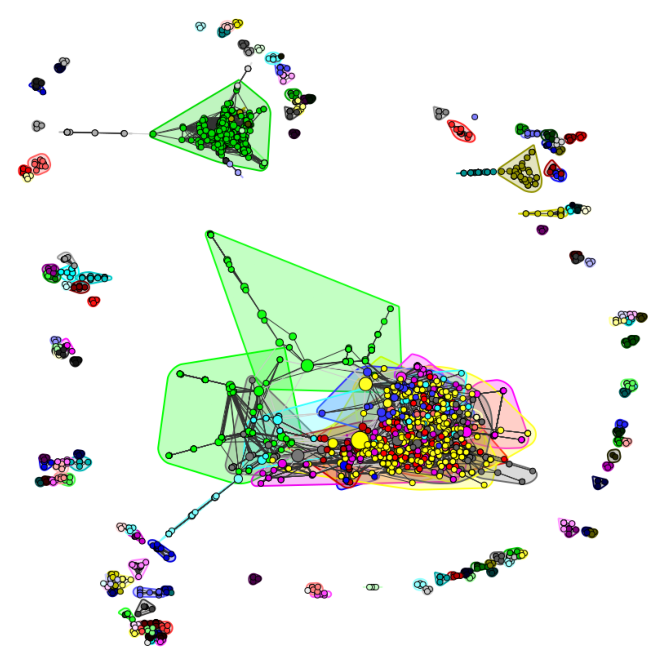

In [75]:
# Plot Network Communities with MDS layout
cluster_plot(g1, g1_leiden, "mds", 800, "g1_leiden_mds.png")

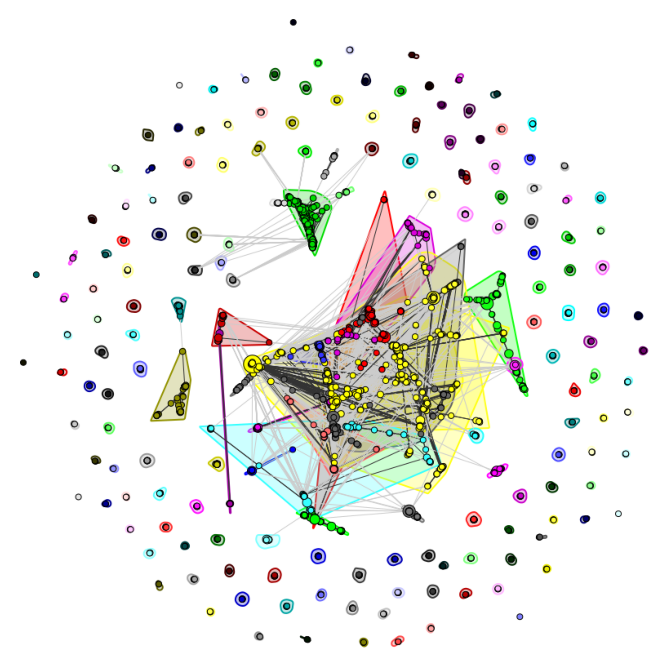

In [76]:
# Plot Network Communities with DRL layout
cluster_plot(g1, g1_leiden, "drl", 800, "g1_leiden_drl.png")

#Part III: Largest Component

In [77]:
# Get the largest component
# Retain only this largest component
cl = g1.clusters()
g2 = cl.giant()

# Get the number of vertices and edges for the largest component
print("Number of vertices:", g2.vcount())
print("Number of edges:", g2.ecount())

Number of vertices: 1506
Number of edges: 10571


##Centrality Measures

Number of degrees calculated:  1506, minimum :  1, maximim :  71
Average degree:  14
The author(s) with the highest degree is/are: ['Zhang, Wei']
Betweeness: minimum:  0.00, maximum:  147847.86
The author(s) with the highest betweenness is/are: ['Zhang, Wei']
Average Path Length:  4.73



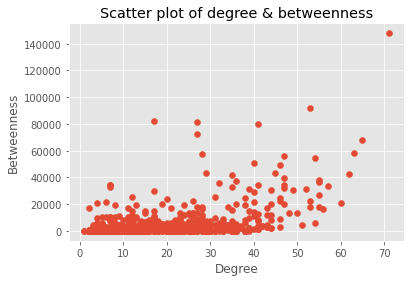

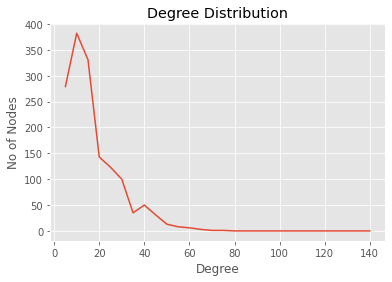

In [78]:
g2_summary = centrality_measures(g2)

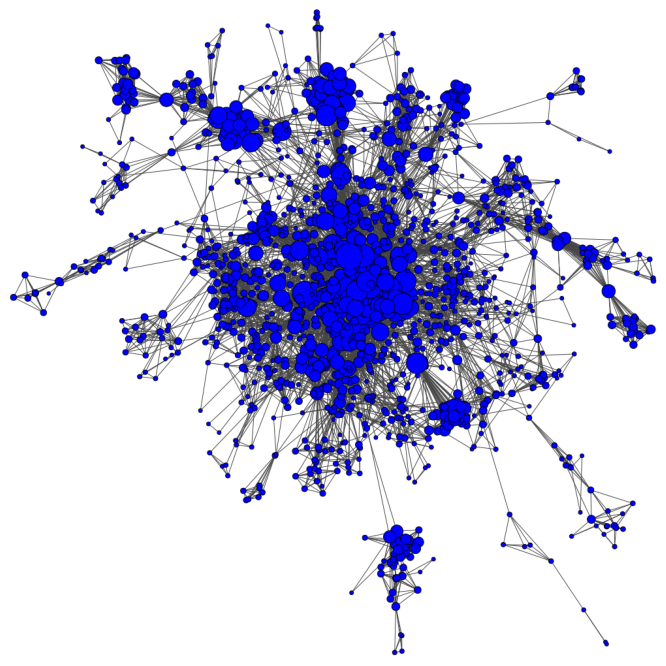

In [79]:
# Calculate FR layout
network_plot(g2, 'fr', 1000, 'g2_network_fr.png')

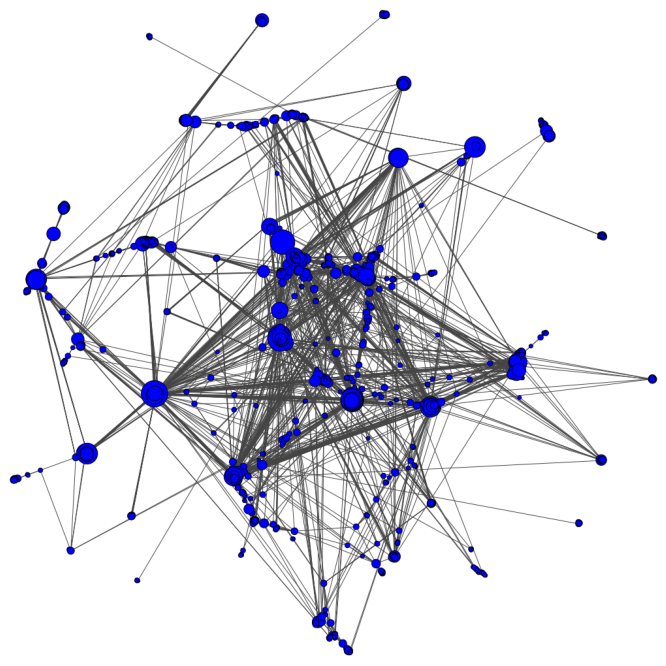

In [80]:
# Calculate DRL layout
network_plot(g2, 'drl', 1000, 'g2_network_drl.png')

##Community Analysis

###Infomap Algorithm

In [81]:
#The Infomap Method
g2_infomap, g2_infomap_sum = clustering_func(g2, "infomap")

In the network there are  116  clusters.
The modularity for the infomap algorithm is 0.78


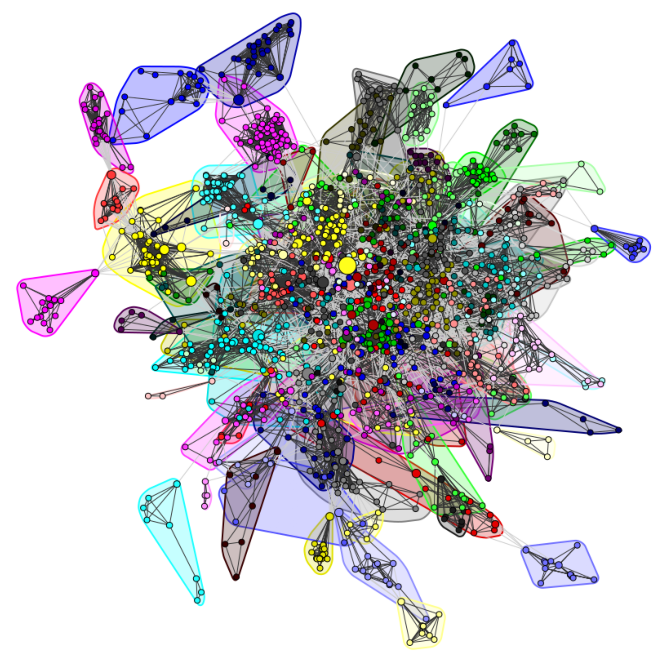

In [84]:
#The FR plot
cluster_plot(g2, g2_infomap, "fr", 800, "largest_clusters_inf_fr.png")

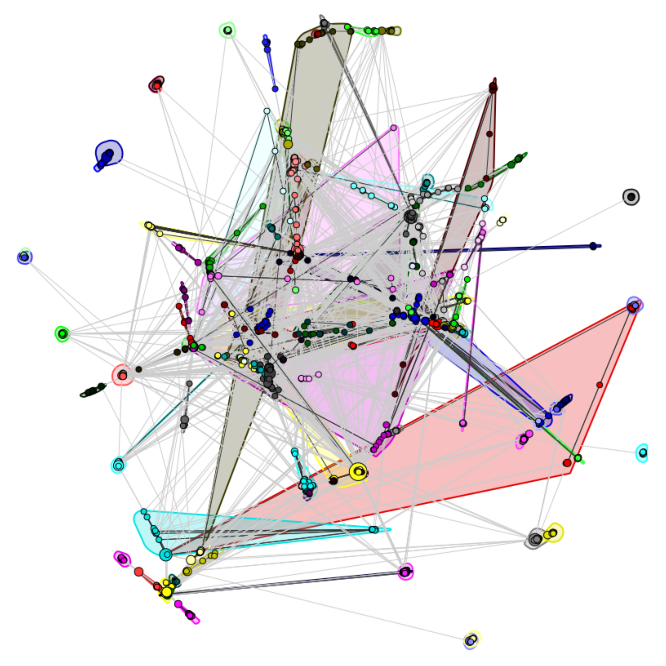

In [85]:
#The DRL plot
cluster_plot(g2, g2_infomap, "drl", 800, "g2_infomap_drl.png")

###Louvain Method

In [86]:
#The Louvain Method
g2_louvain, g2_louvain_sum = clustering_func(g2, "multilevel")

In the network there are  26  clusters.
The modularity for the multilevel algorithm is 0.82


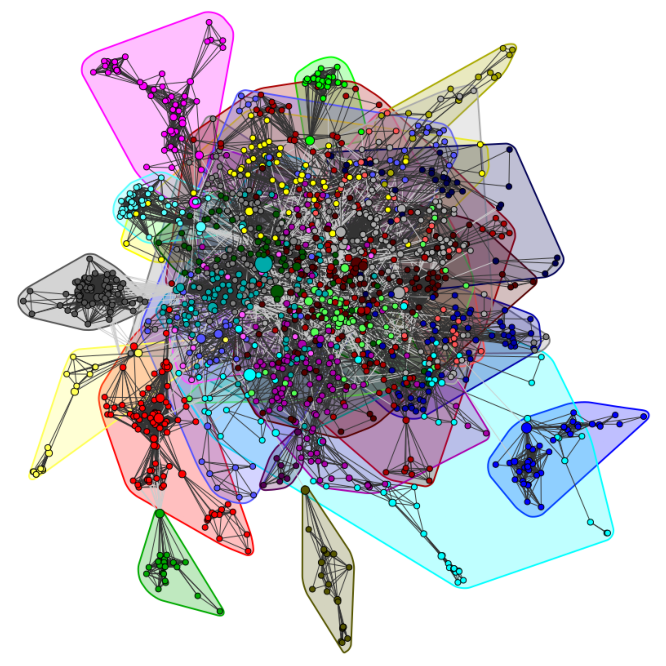

In [87]:
#The FR plot
cluster_plot(g2, g2_louvain, "fr", 800, "g2_louvain_fr.png")

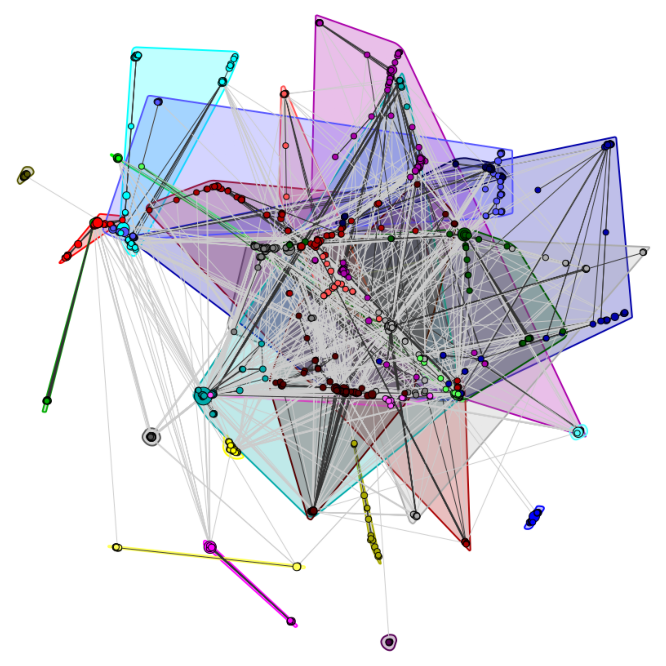

In [94]:
#The DRL plot
cluster_plot(g2, g2_louvain, "drl", 800, "g2_louvain_drl.png")

###Leiden Algorithm

In [89]:
#The Leiden Method
g2_leiden, g2_leiden_sum = clustering_func(g2, "leiden_mod")

In the network there are  27  clusters.
The modularity for the leiden_mod algorithm is 0.83


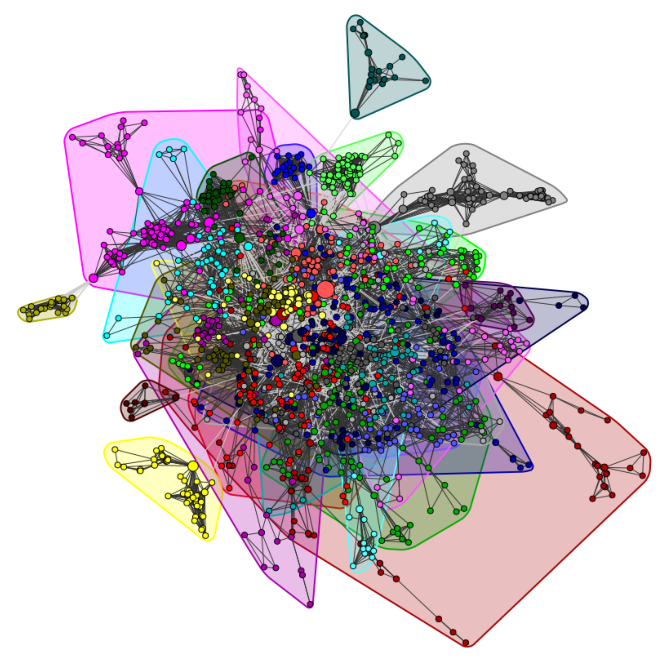

In [90]:
#The FR plot
cluster_plot(g2, g2_leiden, "fr", 800, "g2_leiden_fr.png")

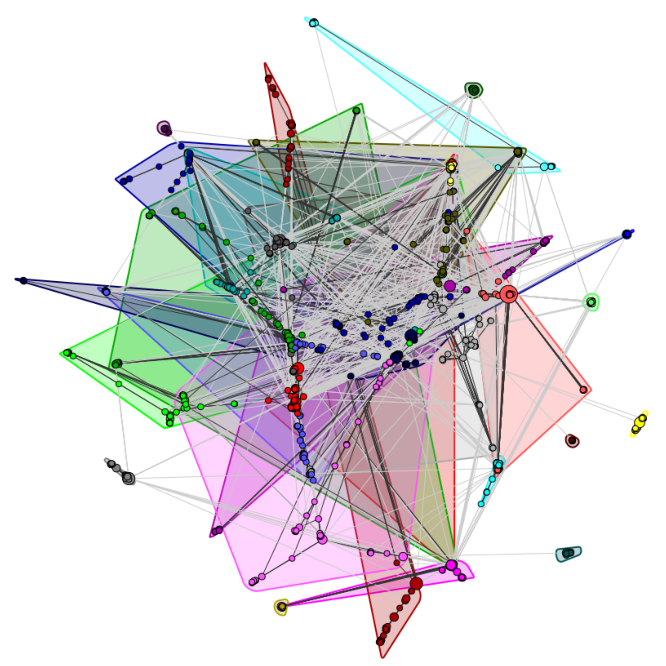

In [95]:
#The DRL plot
cluster_plot(g2, g2_leiden, "drl", 800, "g2_leiden_drl.png")

#Part IV: Network with top 1% authors

In [0]:
# Initialize Graph
g3 = ig.Graph()

# Creat nodes of the network
g3.add_vertices(data2.columns)
am3 = data2.T.dot(data2)

In [16]:
am_net3 = am3.values
am_net3_2 = np.array(am_net3 - np.diag(am_net3.diagonal()))

g3 = ig.Graph.Adjacency((am_net3_2 > 0).tolist())
g3.es['weight'] = am_net3_2[am_net3_2.nonzero()]
g3.vs['label'] = column_list

# Set the network to undirected
g3.to_undirected()

# Get the number of vertices and edges for the largest component
print("Number of vertices:", g3.vcount())
print("Number of edges:", g3.ecount())

Number of vertices: 224
Number of edges: 752


##Centrality Measures

Number of degrees calculated:  224, minimum :  0, maximim :  33
Average degree:  6
The author(s) with the highest degree is/are: ['Ailhaud, L.']
Betweeness: minimum:  0.00, maximum:  2607.53
The author(s) with the highest betweenness is/are: ['Al-Ahdal, M. N.']
Average Path Length:  3.86



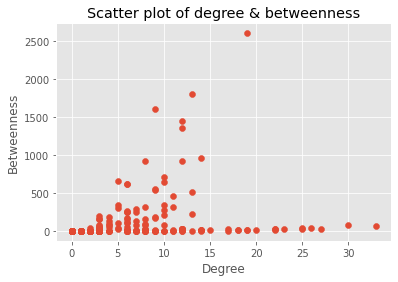

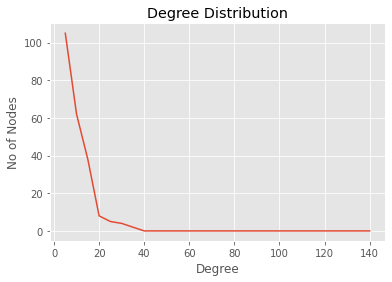

In [17]:
g3_summary = centrality_measures(g3)

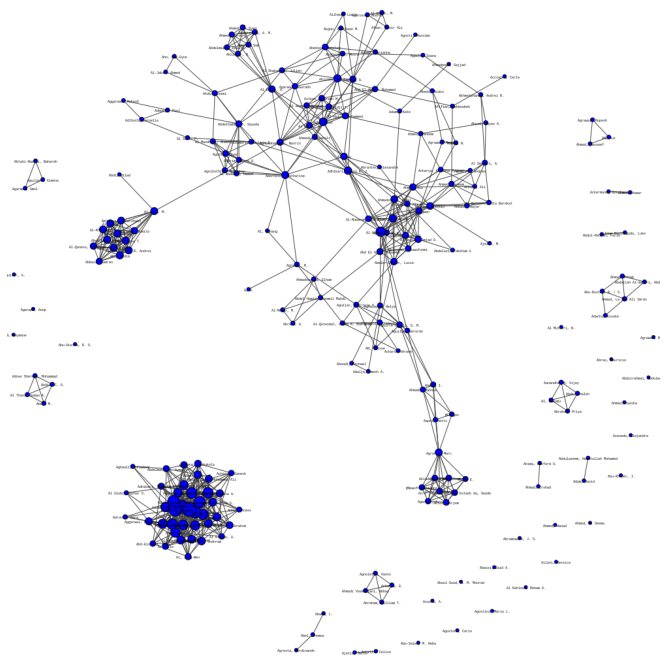

In [27]:
# Calculate fr layout
network_plot(g3, 'fr', 1000, 'g3_network_fr.png', show_labels=True)

##Community Analysis

###Louvain Algorithm

In [18]:
# The Louvain Method
g3_louvain, g3_louvain_sum = clustering_func(g3, "multilevel")

In the network there are  41  clusters.
The modularity for the multilevel algorithm is 0.73


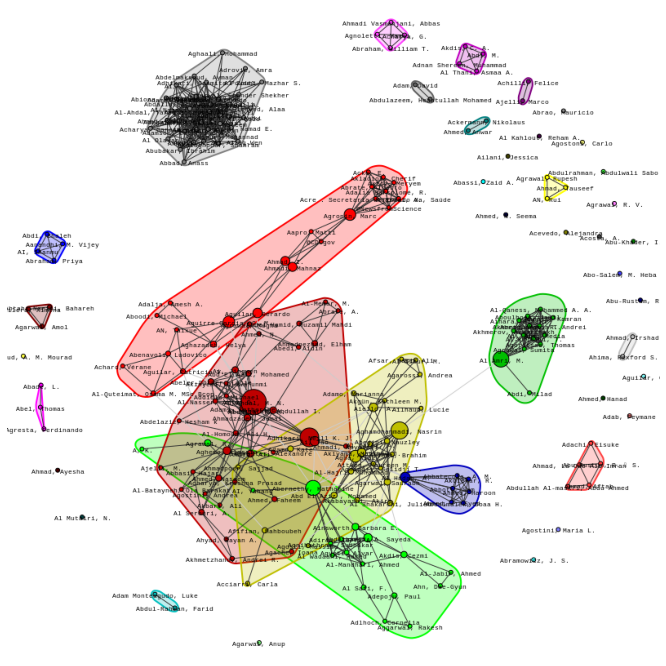

In [19]:
#The FR plot
cluster_plot(g3, g3_louvain, "fr", 800, "g3_louvain_fr.png", show_labels=True)

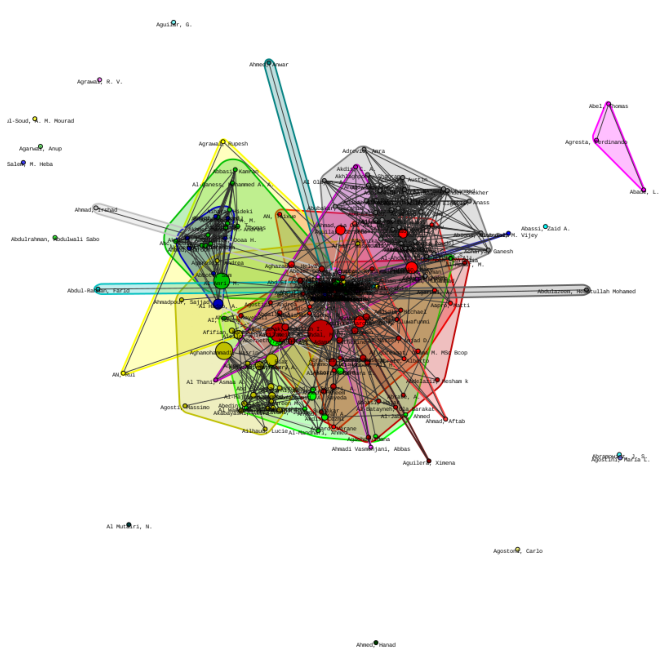

In [80]:
#The KK plot
cluster_plot(g3, g3_louvain, "kk", 800, "g3_louvain_kk.png", show_labels=True)

###Leiden Algorithm

In [21]:
#The Leiden Method
g3_leiden, g3_leiden_sum = clustering_func(g3, "leiden_mod")

In the network there are  42  clusters.
The modularity for the leiden_mod algorithm is 0.73


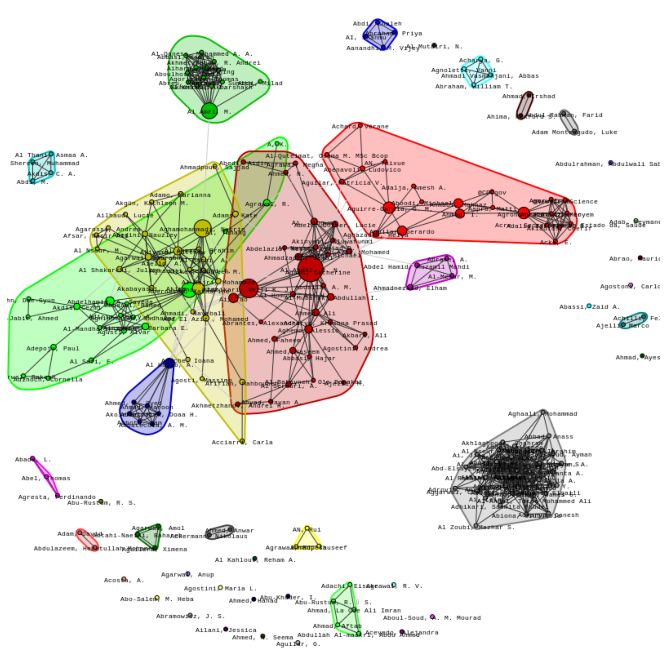

In [22]:
#The FR plot
cluster_plot(g3, g3_leiden, "fr", 800, "g3_leiden_fr.png", show_labels=True)

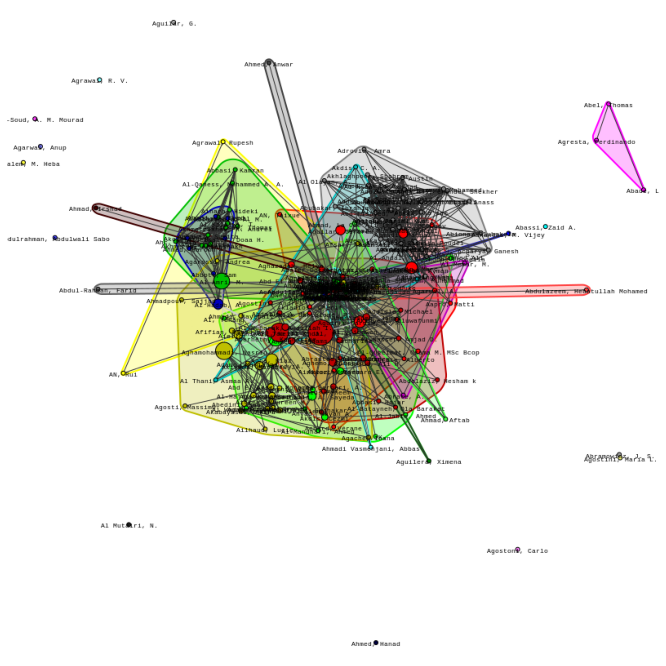

In [23]:
#The KK plot
cluster_plot(g3, g3_leiden, "kk", 800, "g3_leiden_kk.png", show_labels=True)

###Infomap Algorithm

In [24]:
#The Infomap Method
g3_infomap, g3_infomap_sum = clustering_func(g3, "infomap")

In the network there are  52  clusters.
The modularity for the infomap algorithm is 0.70


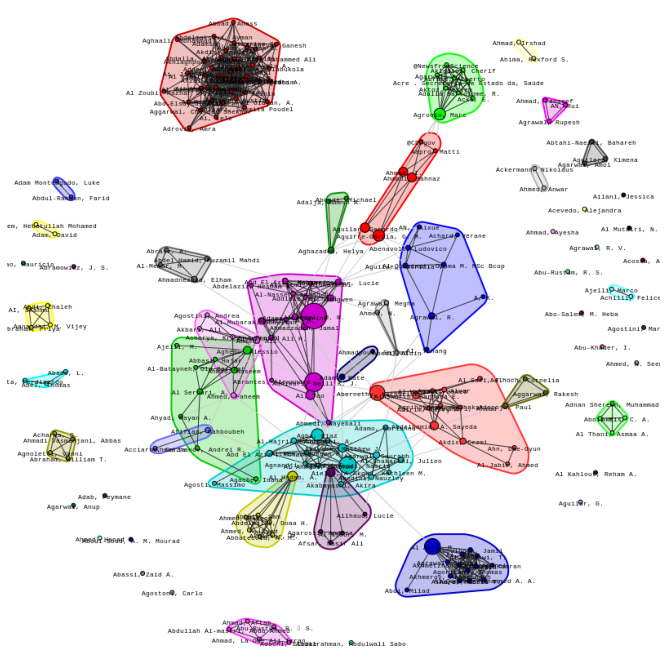

In [25]:
#The FR plot
cluster_plot(g3, g3_infomap, "fr", 800, "g3_infomap_fr.png", show_labels=True)

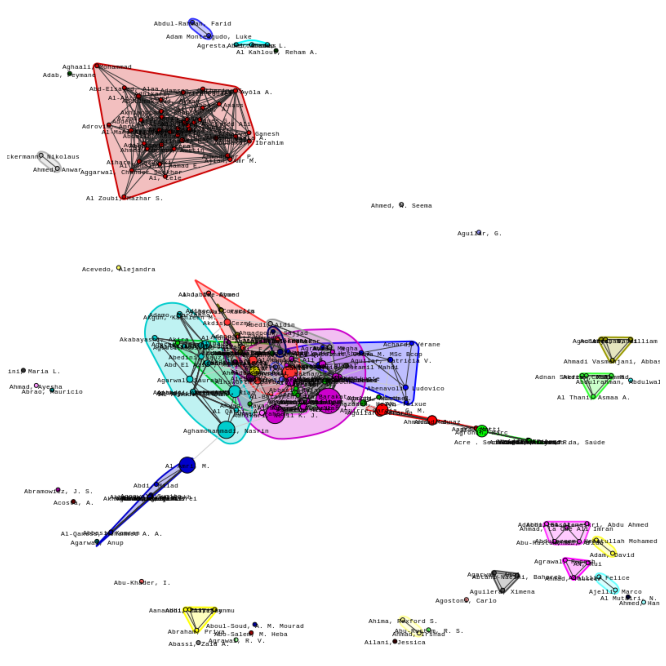

In [26]:
#The MDS plot
cluster_plot(g3, g3_infomap, "mds", 800, "g3_infomap_mds.png", show_labels=True)

##Qualitative Analysis
In this part, we are going to investigate deeper the top 1% authors network and the clustering result generated by the Louvain Algorithm. 
1. We are going to generate the aggregates graph, where the nodes correspond to each community, the size of the node to the number of authors belonging to a particular community and the edge weight corresponds to the number of within-cluster and between-clusters edges.
2. We are going to investigate the authors with highest betweenness who play a critical role in connecting the communities. Moreover, the most collaborative authors are the ones with highest degree
3. Finally we are going to identify some patterns from the resulting structures of detected communities.

IGRAPH U-W- 41 31 -- 
+ attr: node_size (v), weight (e)


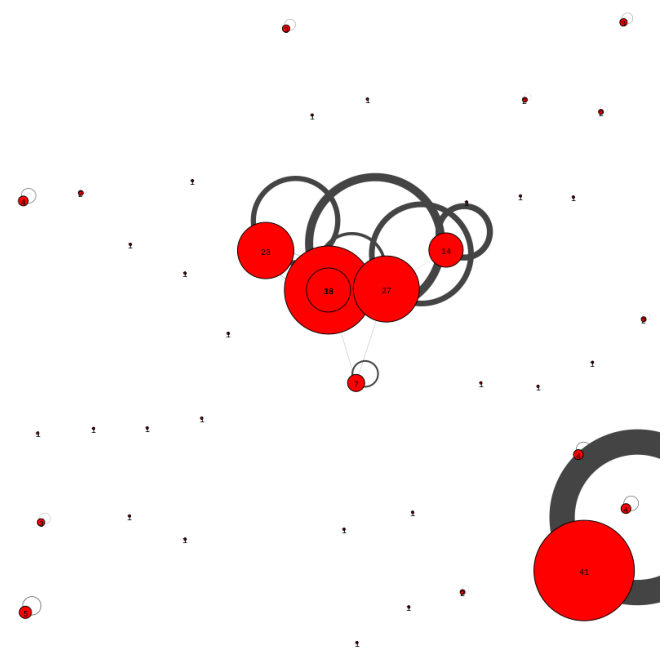

In [24]:
# Based on Louvain method, we calculate the Aggregated Graph
partition = louvain.find_partition(g3, louvain.ModularityVertexPartition)
aggregate_partition = partition.aggregate_partition(partition)
aggregate_graph = aggregate_partition.graph
aggregate_partition.quality() == partition.quality()

print(aggregate_graph.summary())

visual_style = {}
visual_style["vertex_size"] = [3*v for v in aggregate_graph.vs["node_size"]]
visual_style["vertex_label"] = aggregate_graph.vs["node_size"]
visual_style["vertex_label_size"] = 10
visual_style["edge_width"] = [v * 0.1 for v in aggregate_graph.es["weight"]]
visual_style["layout"] = 'mds'
visual_style["bbox"] = (800,800)
visual_style["margin"] = 20

# Save Graph
out = ig.plot(aggregate_graph, **visual_style)
out.save('g3_louvain_aggregate.png')

# Read and show Graph
plt.figure(figsize=(12,12))
img=mpimg.imread('g3_louvain_aggregate.png')
plt.axis('off')
plt.imshow(img)

In [21]:
# Find authors with highest Betweenness
betweenness = g3.betweenness(weights=None)
g3.vs["betweenness"] = betweenness 
membership = g3.community_multilevel().membership

high_betw = []

for i in range(len(g3.vs["betweenness"])):
  if g3.vs[i]['betweenness'] >= 1000:
    auth_betw = []
    auth_betw.append(g3.vs[i]['label'])
    auth_betw.append(g3.vs[i]['betweenness'])
    auth_betw.append(i)
    high_betw.append(auth_betw)

for i in range(len(high_betw)):
  high_betw[i][2] = membership[i]

print('The Authors with highest Betweenness are:')

for elem in high_betw:
  print('Author: {}  --  Betweenness: {:.2f}  --  Belongs to cluster No: {}'.format(elem[0], elem[1], elem[2]))

The Authors with highest Betweenness are:
Author: Abernethy, Katharine  --  Betweenness: 1357.43  --  Belongs to cluster No: 0
Author: Adhikari, Neill K. J.  --  Betweenness: 1809.46  --  Belongs to cluster No: 0
Author: Aghamohammadi, Nasrin  --  Betweenness: 1614.61  --  Belongs to cluster No: 1
Author: Al Amri, M.  --  Betweenness: 1455.00  --  Belongs to cluster No: 2
Author: Al-Ahdal, M. N.  --  Betweenness: 2607.53  --  Belongs to cluster No: 1


To get some insights about the authors, we search for their profiles.
- Abernethy, Katharine: Senior Research Fellow at University of Stirling
- Adhikari, Neill K. J.: Associate scientist at Sunnybrook Health Sciences Centre
- Aghamohammadi, Nasrin: Associate professor of Environmental and Public Health Leader at University of Malaya
- Al Amri, M.: Research Associate at Cardiff University
- Al-Ahdal, M. N.: Adjunct Principal Scientist at King Faisal Specialist Hospital and Research Centre

From this information, we see that there is collaboration between authors from different institutions and countries, for example Universities from UK, Canada, Malaysia and United Arab Emirates. 

Now we look into the authors with highest degrees.




In [23]:
# Find authors with highest Degree
degree = g3.degree()
g3.vs["degree"] = degree 

high_deg = []

for i in range(len(g3.vs["degree"])):
  if g3.vs[i]['degree'] >= 25:
    auth_deg = []
    auth_deg.append(g3.vs[i]['label'])
    auth_deg.append(g3.vs[i]['degree'])
    auth_deg.append(i)
    high_deg.append(auth_deg)

for i in range(len(high_deg)):
  high_deg[i][2] = membership[i]

print('The Authors with highest Degree are:')

for elem in high_deg:
  print('Author: {}  --  Degree: {:.1f}  --  Belongs to cluster No: {}'.format(elem[0], elem[1], elem[2]))

The Authors with highest Degree are:
Author: Afzal, Muhammad Sohail  --  Degree: 25.0  --  Belongs to cluster No: 0
Author: Aggarwal, Neeraj  --  Degree: 26.0  --  Belongs to cluster No: 0
Author: Ahorsu, Daniel Kwasi  --  Degree: 27.0  --  Belongs to cluster No: 1
Author: Ailhaud, L.  --  Degree: 33.0  --  Belongs to cluster No: 2
Author: Ajlan, Amr M.  --  Degree: 25.0  --  Belongs to cluster No: 1
Author: Al-Azzam, Sayer  --  Degree: 30.0  --  Belongs to cluster No: 3


Looking into the Top 1% Network and the Louvain community algorithm, we can identify the below structures:

- Singleton communities of 1 registered author. These are authors with many publications, whose co-authors were removed during pre-processing. 
- Small communities of 3-5 authors, disconnected by the rest of the communities. They can be small research teams, that have contributed lots of papers in a small amount of time
- Small communities with 1 author with high betweenness. These are communities with authors connected to each other, and a single author with connections outside of the community.
- Large communities with high degree and small betweenness. These are clusters where there is lots of collaboration between the authors of the same community of Universities or research centers, however not connection with other communities.
- Large connected communities, with many authors and several connections between communities. 

#Summary
To cunclude we provide a summary of the Centrality measures of the 4 Networks studied above and we compare the performance of the different clustering algorithms, in terms of No of clusters and modularity.

In [0]:
print('------------------------------------------- Network Summary --------------------------------------------')
print('---- Network ---------------- Size ------------- Degree ----------- Betweenness ------ Av. Path Length -')
print('                        # nodes  # links  |  min   max   avg   |    min     max     |                 ')
print('G: Full Network          {}    {}  |  {}     {}   {:.1f}  |    {}   {:.0f}   |        {:.2f}       '.format(g_summary[0],g_summary[1],g_summary[2],g_summary[3],g_summary[4],g_summary[5],g_summary[6],g_summary[7]))
print('G1: Reduced Network      {}     {}   |  {}     {}   {:.1f}  |    {}   {:.0f}    |        {:.2f}       '.format(g1_summary[0],g1_summary[1],g1_summary[2],g1_summary[3],g1_summary[4],g1_summary[5],g1_summary[6],g1_summary[7]))
print('G2: Largest Component    {}     {}   |  {}     {}    {:.1f}  |    {}   {:.0f}    |        {:.2f}       '.format(g2_summary[0],g2_summary[1],g2_summary[2],g2_summary[3],g2_summary[4],g2_summary[5],g2_summary[6],g2_summary[7]))
print('G3: Top 1% Authors       {}      {}     |  {}     {}    {:.1f}   |    {}   {:.0f}      |        {:.2f}       '.format(g3_summary[0],g3_summary[1],g3_summary[2],g3_summary[3],g3_summary[4],g3_summary[5],g3_summary[6],g3_summary[7]))

------------------------------------------- Network Summary --------------------------------------------
---- Network ---------------- Size ------------- Degree ----------- Betweenness ------ Av. Path Length -
                        # nodes  # links  |  min   max   avg   |    min     max     |                 
G: Full Network          20531    132394  |  0     277   12.9  |    0.0   2400155   |        5.16       
G1: Reduced Network      2980     19261   |  0     133   12.9  |    0.0   147848    |        4.55       
G2: Largest Component    1506     10571   |  1     71    14.0  |    0.0   147848    |        4.73       
G3: Top 1% Authors       224      752     |  0     33    6.7   |    0.0   2608      |        3.86       


In [0]:
print('--------------------------------------- Clustering Summary ---------------------------------------------')
print('---- Network -------- --------- Louvain --------- --------- Leiden --------- --------- Infomap ---------')
print('                        # Clusters   Modularity     # Clusters   Modularity    # Clusters   Modularity  ')
print('G: Full Network             {}        {:.2f}     |      {}        {:.2f}    |      {}        {:.2f}       '.format(g_louvain_sum[0],g_louvain_sum[1],g_leiden_sum[0],g_leiden_sum[1],g_infomap_sum[0],g_infomap_sum[1]))
print('G1: Reduced Network         {}         {:.2f}     |      {}         {:.2f}    |      {}         {:.2f}       '.format(g1_louvain_sum[0],g1_louvain_sum[1],g1_leiden_sum[0],g1_leiden_sum[1],g1_infomap_sum[0],g1_infomap_sum[1]))
print('G2: Largest Component       {}          {:.2f}     |      {}          {:.2f}    |      {}         {:.2f}       '.format(g2_louvain_sum[0],g2_louvain_sum[1],g2_leiden_sum[0],g2_leiden_sum[1],g2_infomap_sum[0],g2_infomap_sum[1]))
print('G3: Top 1% Authors          {}          {:.2f}     |      {}          {:.2f}    |      {}          {:.2f}       '.format(g3_louvain_sum[0],g3_louvain_sum[1],g3_leiden_sum[0],g3_leiden_sum[1],g3_infomap_sum[0],g3_infomap_sum[1]))

--------------------------------------- Clustering Summary ---------------------------------------------
---- Network -------- --------- Louvain --------- --------- Leiden --------- --------- Infomap ---------
                        # Clusters   Modularity     # Clusters   Modularity    # Clusters   Modularity  
G: Full Network             2686        0.95     |      2688        0.95    |      3194        0.89       
G1: Reduced Network         178         0.88     |      179         0.88    |      295         0.84       
G2: Largest Component       26          0.82     |      28          0.83    |      113         0.78       
G3: Top 1% Authors          41          0.73     |      42          0.73    |      52          0.70       
